# Домашнее задание №2

<span style="color: red; font-size: 14pt">Дедлайн: 13 марта 23:59</span>

Машинное обучение, ФИВТ, Весна 2018

Составлено с использованием материалов Евгения Колмакова и Юрия Кашницкого (открытый курс машинного обучения, тема 3), а также лекций по машинному обучению Евгения Соколова

**Оформление дз**: 
- Присылайте выполненное задание на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall <номер_группы> <фамилия>``, к примеру -- ``ML2018_fall 596 ivanov``
- Выполненное дз сохраните в файл ``ML2018_<фамилия>_<группа>_task<номер задания>.ipnb``, к примеру -- ``ML2018_ivanov_596_task1.ipnb``

**Вопросы**:
- Присылайте вопросы на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall Question <Содержание вопроса>``

--------
- **PS1**: Используются автоматические фильтры, мы не найдем ваше дз, если вы укажете тему письма в неправильном формате.
- **PS2**: Просроченный дедлайн снижает максимальный вес задания по формуле, указнной на первом семинаре

## Часть 0. Вопросы для самоконтроля

##### Перед выполнением задания убедитесь, что вы знаете ответы на этот теор.минимум
##### Эта часть задания не оценивается, ответы можно не записывать

1. Что такое решающее дерево? Как по построенному дереву найти прогноз для объекта?
2. Почему для любой выборки можно построить дерево, имеющее нулевую ошибку на ней? Приведите примеры.
3. Почему не рекомендуется строить небинарные деревья (имеющие более двух потомков у каждой вершины)?
4. Как устроен жадный алгоритм построения дерева?
5. Какие критерии информативности для решения задачи классификации вы знаете?
6. Какой смысл у критерия Джини и энтропийного критерия?
7. Какие критерии информативности для решения задачи регрессии вы знаете?
8. Что такое pruning (стрижка) дерева? Чем отличаются post-pruning и pre-pruning?
9. Какие методы обработки пропущенных значений вы знаете?
10. Как учитывать категориальные признаки в решающем дереве?
11. Что такое mean target encoding? Почему эта техника хорошо работает для решающих деревьев?
12. Как работает отбор признаков с помощью решающих деревьев?

## Часть 1. Теоретические задачи

##### 30% баллов за задание, оценочное время выполнения 1 час

##### Решение можно затехать здесь или написать от руки и добавить фото в ноутбук

### Задача 1 (10% баллов)

Какая стратегия поведения в листьях регрессионного дерева приводит к меньшему матожиданию ошибки по MSE: отвечать средним значением таргета на объектах обучающей выборки, попавших в лист, или отвечать таргетом для случайного объекта из листа (считая все объекты равновероятными)?

**Ответ**:

$y_{real}$ -- истинное значение величины, $y_l$ -- ответы в листе.

Ошибка по MSE в случае, когда отвечаем средним значением таргета на объектах обучающей выборки, попавших в лист:
$error_{1} = (y_{real} - \overline{y_{l}})^2 = y_{real}^2 - 2 y_{real} \overline{y_{l}} + \overline{y_{l}}^2$

Ошибка по MSE в случае, когда отвечаем таргетом для случайного объекта из листа (считая все объекты равновероятными): $error_{2} = \frac{1}{k} \sum\limits_{y \in y_{l}} (y_{real} - y)^2 = y_{real}^2 - 2 y_{real} \overline{y_{l}} + \overline{y_{l}^2}$, где $k$ -- количество объектов в листе.

Знаем, что дисперсия положительна $\Rightarrow$ $\overline{y_{l}}^2 \leq \overline{y_{l}^2}$ $\Rightarrow$ $error_1 \leq error_2 \Rightarrow $ первая стратегия лучше.

### Задача 2 (15% баллов)

Критерий информативности для набора объектов $L$ вычисляется на основе того, насколько хорошо их целевые переменные предсказываются константой (при оптимальном выборе этой константы):
$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} L(y_i, c),$$
где $L(y_i, c)$- некоторая функция потерь. Соответственно, чтобы получить вид критерия при конкретной функции потерь, необходимо аналитически найти оптимальное значение константы и подставить его в формулу для $H(R)$.

Выведите критерии информативности для следующих функций потерь:
1. $L(y,c) = (y-c)^2$
2. $L(y,c) = \sum_{k=1}^K (c_k-[y=k])^2$
3. $L(y,c) = -\sum_{k=1}^K [y=k]\log c_k$

**Подсказка**:
должны получиться дисперия, критерий Джини и энтропийный критерий.

**Ответ**:

1) Пусть $$T(c) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} L(y_i, c)$$

$$T(c) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i-c)^2$$

$$T'(c) = -\dfrac{2}{|R|} \sum_{(x_i,y_i) \in R} (y_i-c) = 0 \ \ \Rightarrow \ \ c = \overline{y} $$

$$\Rightarrow H(R) =  \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i - \overline{y})^2 = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i - \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} y_i)^2 \leftarrow дисперсия $$


2) В точке экстремума градиент должен быть равен 0. Значит, производные по каждой из переменных должны быть равны 0.
$$\left(\frac{1}{n}\sum_y\sum_k^K(c_k-[y=k])^2\right)^\prime_{c_i} = \left(\frac{1}{n}\sum_y\sum_k^K(c_k^2 + [y=k]^2 - 2c_k[y=k])\right)^\prime_{c_i} = \frac{1}{n}\sum_y(2c_i - 2[y=k_i]) = 2c_i - 2p_i = 0$$ 
$$\Rightarrow c_i = p_i$$

$$\Rightarrow H(R) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (p_k-[y=k])^2 = \dfrac{1}{|R|} \sum_{k=1}^K \sum_{(x_i,y_i) \in R} (p_k^2 - 2 p_k [y=k] + [y=k]) = \dfrac{1}{|R|} \sum_{k=1}^K (|R|p_k^2 - 2 |R| p_k^2 + |R|p_k) = \sum_{k=1}^K p_k(1-p_k) \leftarrow \text{критерий Джини}$$

3) ???

### Задача 3 (5% баллов)

Запишите оценку сложности построения одного решающего дерева в зависимости от размера обучающей выборки $l$, числа признаков $d$, максимальной глубины дерева $D$. В качестве предикатов используются пороговые функции $[x_j>t]$. При выборе предиката в каждой вершине перебираются все признаки, а в качестве порогов рассматриваются величины $t$, равные значения этого признака на объектах, попавших в текущую вершину. Считайте сложность вычисления критерия информативноси константной.

**Ответ:**

На каждом уровне мы вычисляем иформативность $O(l \cdot d)$ раз (В худшем случае проходимся для каждого признака (всего признаков $j$) по всем его пороговым значениям на выборке (которых в худшем случае $l$)).
Всего уровней $D$, следовательно, общая сложность построения одного решающего дерева: $O(D \cdot l \cdot d)$

## Часть 2. Визуализация решающих деревьев

##### 20% баллов за задание, оценочное время выполнения 30 минут

Для начала нужно поставить GraphViz

- На macOS:
    - sudo pip install pydotplus
    - brew install graphviz
- Linux должно работать то же самое с заменой brew на sudo apt-get
    - sudo pip install pydotplus
    - sudo apt-get install graphviz
- Windows
    - Установить GraphViz отсюда: http://www.graphviz.org/Download_windows.php
    - Добавить путь к папке bin в PATH (например, "C:\Programs\Graphviz2.38\bin")
    - pip install pydotplus

Постройте решающее дерево из sklearn на датасете Car Evaluation Dataset (https://archive.ics.uci.edu/ml/datasets/car+evaluation)

In [1]:
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
from sklearn import preprocessing
import numpy as np


In [2]:
def number_encode_features(init_df):
    result = init_df.copy()
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == np.object:
            encoders[column] = preprocessing.LabelEncoder()
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders

In [3]:
# считываем данные
data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data', header=None)
columns = ('buying maint doors persons lug_boot safety car_acceptability')
data.columns = columns.split()
encoded_data, encoders = number_encode_features(data)

In [4]:
model_gini = DecisionTreeClassifier() # model_gini, потому что criterion='gini' по дефолту
model_gini.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Визуализируйте получившееся дерево с помощью GraphViz (следующая функция может помочь):

In [63]:
import IPython.display #needed to render in notebook
import pydotplus  #needed to convert dot format to png
from sklearn import tree
from io import StringIO

def draw_decision_tree(clf, column_names, max_depth=None, ):
    dot_data = StringIO() 
    tree.export_graphviz(clf, out_file=dot_data, feature_names=column_names, filled=True) 
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    a = IPython.display.Image(graph.create_png())
    IPython.display.display(a)

Посмотрите, как меняется картинка для различных значений структурных параметров (варьируйте параметры **max_depth, criterion, min_samples_leaf, max_features**). Убедитесь, что увеличение глубины дерева и уменьшение количества объектов в листьях способствует гибкости модели и, как следствие, переобучению (что соответствует интуитивным соображениям о структуре дерева).

**Разные критерии (criterion)** 

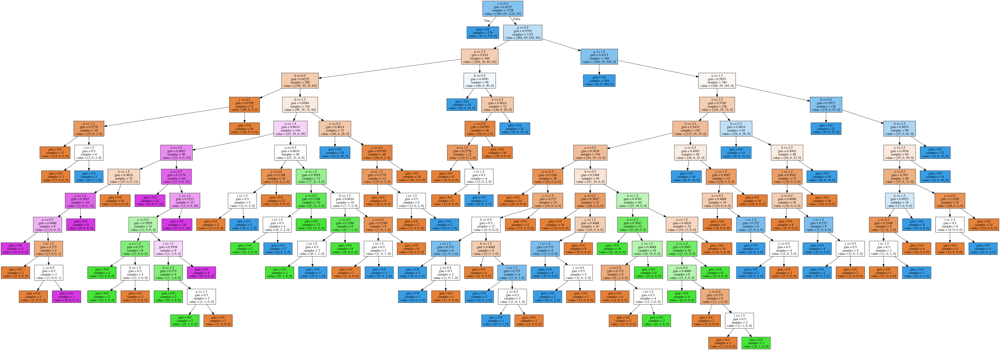

In [80]:
draw_decision_tree(model_gini, columns)

In [81]:
model_gini.tree_.max_depth

14

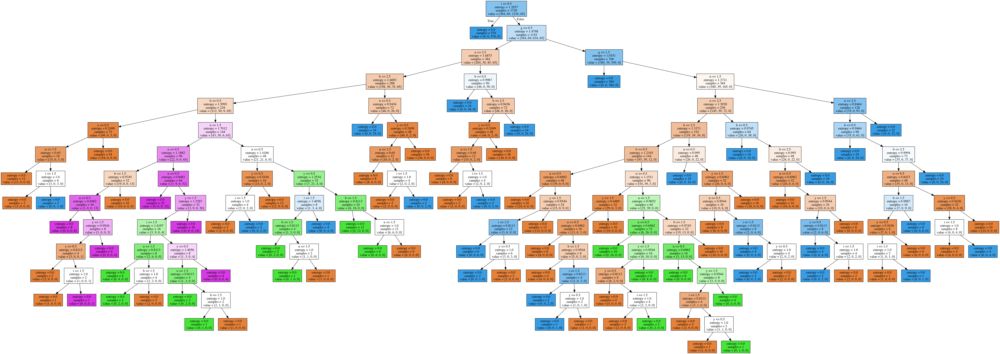

In [85]:
model_entropy = DecisionTreeClassifier(criterion='entropy')
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

In [78]:
model_entropy.tree_.max_depth

14

На первый взгляд деревья с разными критериями почти не отличаются (особенно это касается вершин на невысокой глубине; кажется, что какие-то различия начинаются проявляться ближе к листьям).

**Разная глубина (max_depth)**

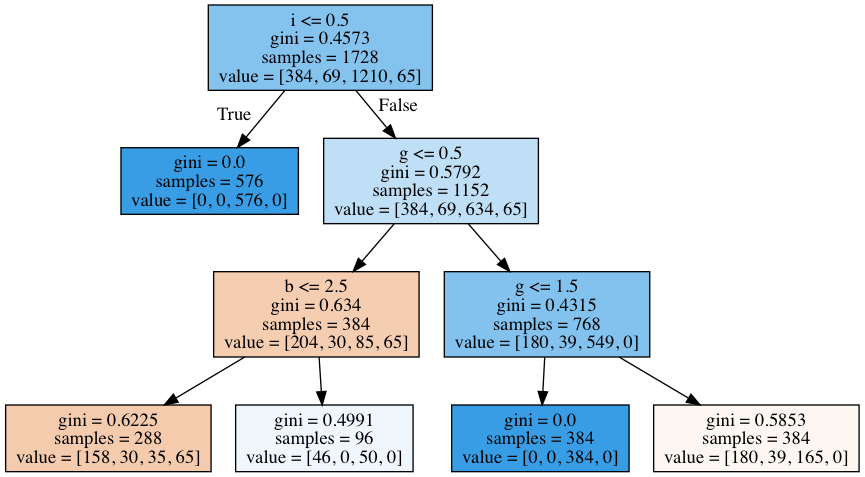

In [90]:
model_entropy = DecisionTreeClassifier(max_depth=3)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

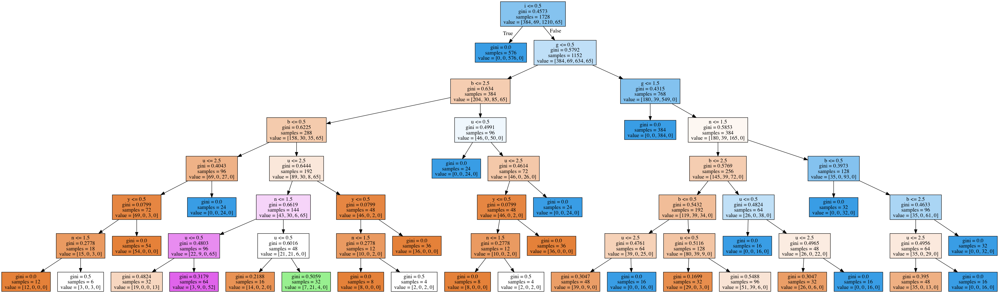

In [91]:
model_entropy = DecisionTreeClassifier(max_depth=7)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

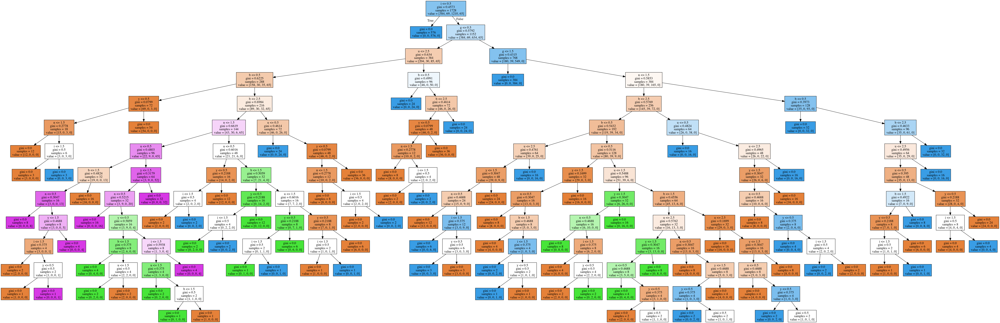

In [92]:
model_entropy = DecisionTreeClassifier(max_depth=13)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

**Разные минимальные количества сэмплов в листьях (min_samples_leaf)**

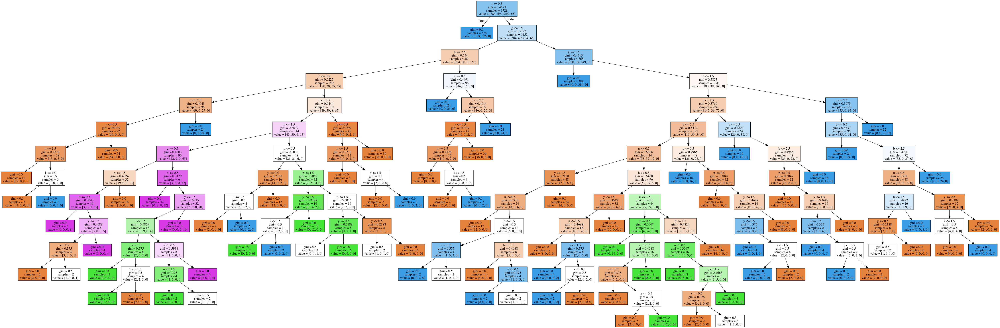

In [96]:
model_entropy = DecisionTreeClassifier(min_samples_leaf=2)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

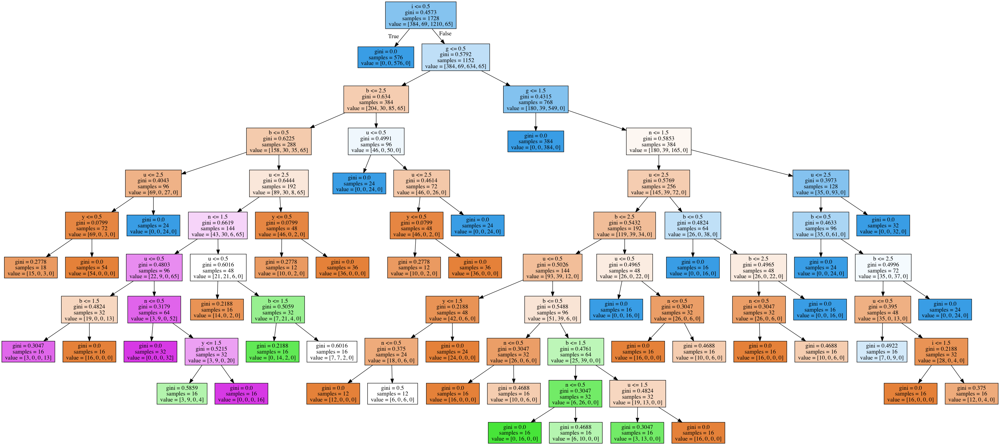

In [97]:
model_entropy = DecisionTreeClassifier(min_samples_leaf=10)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

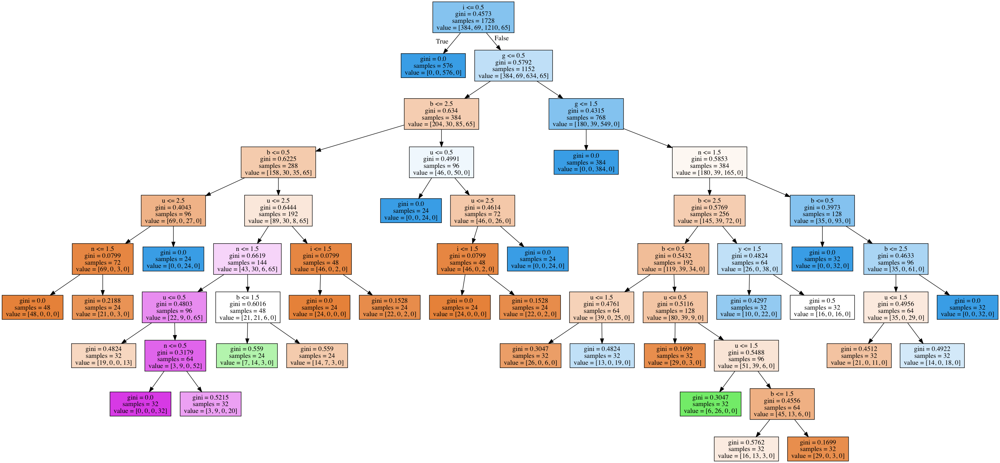

In [98]:
model_entropy = DecisionTreeClassifier(min_samples_leaf=20)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

Видно, что чем меньше количество сэмплов, необходимых для листа, тем переобученнее дерево.

**Разное количество признаков при сплите (max_features)** 

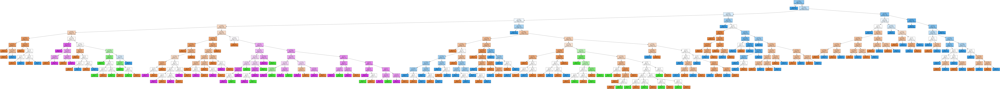

In [99]:
model_entropy = DecisionTreeClassifier(max_features=2)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

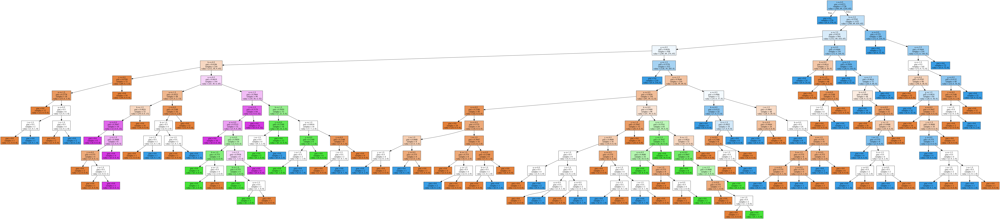

In [100]:
model_entropy = DecisionTreeClassifier(max_features=4)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

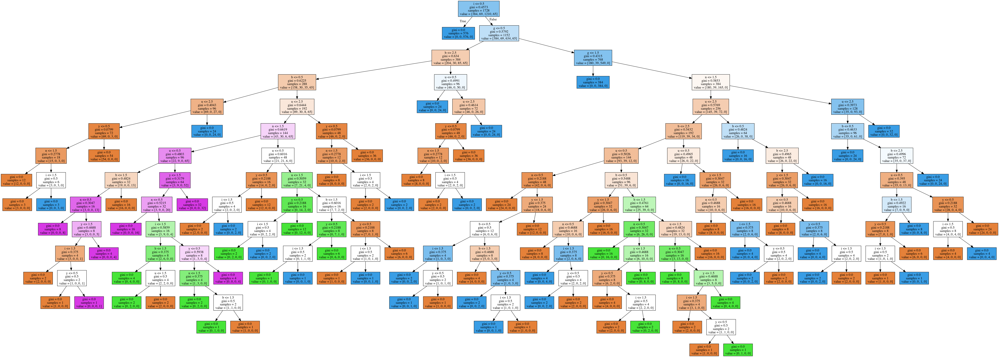

In [101]:
model_entropy = DecisionTreeClassifier(max_features=6)
model_entropy.fit(encoded_data.iloc[:, :-1], encoded_data.iloc[:, 6:7])
draw_decision_tree(model_entropy, columns)

Видно, что чем меньше max_features, тем переобученнее дерево.

## Часть 3. Реализация алгоритма построения дерева решений

##### 50% баллов за задание, оценочное время выполнения 2-3 часа

In [896]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.base import BaseEstimator
from sklearn.datasets import make_classification, make_regression, load_digits, load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error
from collections import Counter
from random import sample
from tqdm import tqdm
from mpmath import *

Зафиксируем заранее `random_state` (a.k.a. random seed). Это должно повысить вероятность полной воспроизводимости результатов, впрочем, замечено, что тем не менее небольшие флуктуации возможны (например, качества прогнозов дерева, которое мы сейчас вырастим) в случае разных ОС.

In [680]:
RANDOM_STATE = 42

**Необходимо реализовать класс `DecisionTree`**

**Спецификация:**
- класс наследуется от `sklearn.BaseEstimator`;
- конструктор содержит следующие параметры: 
    `max_depth` - максимальная глубина дерева (по умолчанию - `numpy.inf`); 
    `min_samples_split` - минимальное число объектов в вершине, при котором происходит её разбиение (по умолчанию - 2); 
    `criterion` - критерий разбиения (для классификации - 'gini' или 'entropy', для регрессии - 'variance' или 'mad_median'; 
    по умолчанию - 'gini');
    
    Функционал, значение которого максимизируется для поиска оптимального разбиения в данной вершине имеет вид
    $$Q(X, j, t) = F(X) - \dfrac{|X_l|}{|X|} F(X_l) - \dfrac{|X_r|}{|X|} F(X_r),$$
    где $X$ - выборка, находящаяся в текущей вершине, $X_l$ и $X_r$ - разбиение выборки $X$ на две части 
    по предикату $[x_j < t]$, а $F(X)$ -критерий разбиения.
    
    1. Для классификации: пусть $p_i$ - доля объектов $i$-го класса в выборке $X$.
    
        - 'gini': Неопределенность Джини $F(X) = 1 -\sum_{i = 1}^K p_i^2$.
    
        - 'entropy': Энтропия $F(X) = -\sum_{i = 1}^K p_i \log_2(p_i)$.
    
    2. Для регрессии: $y_j = y(x_j)$ - ответ на объекте $x_j$, $y = (y_1, \dots, y_{|X|})$ - вектор ответов.
    
        - 'variance': Дисперсия (среднее квадратичное отклонение от среднего) $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}(y_j - \dfrac{1}{|X|}\sum_{x_i \in X}y_i)^2$
    
        - 'mad_median': Среднее отклонение от медианы $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}|y_j - \mathrm{med}(y)|$
    
- класс имеет методы `fit`, `predict` и `predict_proba`;
- метод `fit` принимает матрицу объектов `X` и вектор ответов `y` (объекты `numpy.ndarray`) и возвращает экземпляр класса
    `DecisionTree`, представляющий собой решающее дерево, обученное по выборке `(X, y)` с учётом заданных в конструкторе параметров; 
- метод `predict_proba` принимает матрицу объектов `X` и возвращает матрицу `P` размера `X.shape[0] x K`, где `K` - число классов, такую что $p_{ij}$ есть вероятность принадлежности объекта, заданного $i$-ой строкой матрицы X к классу $j \in \{1, \dots, K\}$.
- метод `predict` принимает матрицу объектов и возвращает вектор предсказанных ответов; в случае классификации - это 
    наиболее многочисленный класс в листе, в который попал объект, а в случае регрессии - среднее значение ответов по 
    всем объектам этого листа;

**Советы по реализации:**

- Обучение дерева можно реализовать простым жадным рекурсивным алгоритмом: каждый раз выбирать наилучшее разбиение (номер признака и порог по нему).
- Если возможных порогов для разбиения будет слишком много, выбор наилучшего разбиения окажется вычислительно очень громоздкой задачей. Можно ограничить множество порогов любым удобным способом (например, посчитать квантили значений каждого признака или просто взяв случайный набор порогов).
- Лучше не подсматривать решение в готовых нагугленных вариантах. От вас требуется сделать всего лишь максимально простую реализацию того, как строится и применяется решающее дерево, а не применимую на практике универсальную библиотеку.

### Реализация (30% баллов)

In [681]:
def gini(y):
    class_stats = dict(Counter(y))
    values = np.array(list(class_stats.values()))
    p_i = values / np.sum(values)
    return 1 - np.sum(p_i ** 2)

In [682]:
def entropy(y):  
    class_stats = dict(Counter(y))
    values = np.array(list(class_stats.values()))
    p_i = values / np.sum(values)
    return -1 * np.sum(p_i * np.log2(p_i))

In [903]:
def variance(y):
    return np.sum((y - np.mean(y)) ** 2) / len(y)


In [904]:
def mad_median(y):
    return np.sum(np.abs(y - np.median(y))) / len(y)


In [736]:
def calculate_Q(X, y, j, t, criterion):
    # сначала надо понять, для каких объектов выборки предикат равен 1,
    # а для каких равен 0 для заданных j (номер признака) и t (пороговое значение признака)
    predicate_value = np.zeros(X.shape[0])
    for i in np.arange(len(X[:, j])):
        predicate_value[i] = (X[i, j] < t)
    # теперь X можно разделить на X_r и X_l
    X_r_index = np.ravel(np.argwhere(predicate_value == 1))
    X_l_index = np.ravel(np.argwhere(predicate_value == 0))
    if criterion == 'gini':
        ans = gini(y) - len(X_l_index) / len(y) * gini(y[X_l_index]) - len(X_r_index) / len(y) * gini(y[X_r_index])
    elif criterion == 'entropy':
        ans = entropy(y) - len(X_l_index) / len(y) * entropy(y[X_l_index]) - len(X_r_index) / len(y) * entropy(y[X_r_index])
    elif criterion == 'variance':
        ans = variance(y) - len(X_l_index) / len(y) * variance(y[X_l_index]) - len(X_r_index) / len(y) * variance(y[X_r_index])
    elif criterion == 'mad_median':
        ans = mad_median(y) - len(X_l_index) / len(y) * mad_median(y[X_l_index]) - len(X_r_index) / len(y) * mad_median(y[X_r_index])
    return ans

In [949]:
class DecisionTree(BaseEstimator):
    
    def __init__(self, max_depth=np.inf, min_samples_split=2, 
                 criterion='gini', cur_depth=0, debug=False):
        self.left = None
        self.right = None
        self.predicate = None # для внутренних вершин; предикат представляет из себя tuple (j, t),
                              # где j -- это номер признака, t -- его пороговое значение
        self.class_labels_and_counts = None # для листов
        self.cur_depth = cur_depth 
        
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.criterion = criterion
    
    def fit(self, X, y):

        self.class_labels_and_counts = Counter(y)
                
        # Если достигли максимальной допустимой глубины
        if self.cur_depth == self.max_depth:
            return self
        
        # Если количество объектов выборки в вершине меньше допустимого
        if len(y) < self.min_samples_split:
            return self
        
        # Если все объекты выборки лежат в одном классе
        if len(self.class_labels_and_counts) == 1:
            return self
        
        # Ищем предикат с максимальной информативностью
        self.predicate = (0, 0) #???
        Q_max = -np.inf
        for j in np.arange(X.shape[1]):
            for t in np.unique(X[1:, j]):
                Q_cur = calculate_Q(X, y, j, t, self.criterion)
                if Q_cur > Q_max:
                    Q_max = Q_cur
                    self.predicate = (j, t)
        # Разбиваем  выборку на две части X_r и X_l по найденному предикату
        predicate_value = np.zeros(X.shape[0])
        j = self.predicate[0]
        t = self.predicate[1]
        for i in np.arange(len(X[:, j])):
            predicate_value[i] = (X[i, j] < t)
        
        X_r_index = np.ravel(np.argwhere(predicate_value == 1))
        X_l_index = np.ravel(np.argwhere(predicate_value == 0))
            
        # Если найденному предикату все-таки не удалось разбить выборку в текущей вершине
        if (len(X_r_index) == 0) or (len(X_l_index) == 0):
            self.predicate = None
            return self
        else:
            self.right = DecisionTree(self.max_depth, self.min_samples_split, self.criterion, self.cur_depth + 1)
            self.right.fit(X[X_r_index, :], y[X_r_index])
            
            self.left = DecisionTree(self.max_depth, self.min_samples_split, self.criterion, self.cur_depth + 1)
            self.left.fit(X[X_l_index, :], y[X_l_index])
        return self
                    
    def predict(self, X):
        y = np.zeros(X.shape[0])
        for i in np.arange(X.shape[0]):
            cur_node = self
            while (cur_node.right is not None) or (cur_node.left is not None):
                j = cur_node.predicate[0]
                t = cur_node.predicate[1]
                if (X[i,j] < t):
                    cur_node = cur_node.right
                else:
                    cur_node = cur_node.left
            
            # Если мы пришли сюда, то мы находимся в листе.
            # Значит, пора записать результирующий класс
            
            # классификация
            if (self.criterion == 'gini' or self.criterion == 'entropy'):
                y[i] = cur_node.class_labels_and_counts.most_common(1)[0][0]
            # регрессия
            if (self.criterion == 'variance' or self.criterion == 'mad_median'):
                keys = np.array(list(cur_node.class_labels_and_counts.keys()))
                values = np.array(list(cur_node.class_labels_and_counts.values()))
                y[i] = float(np.sum(keys * values)) / float(np.sum(values))


        return y
            
    def predict_proba(self, X):
        proba = np.zeros((X.shape[0], len(self.class_labels_and_counts)), dtype=float)
        for i in np.arange(X.shape[0]):
            cur_node = self
            while (cur_node.right is not None) or (cur_node.left is not None):
                j = cur_node.predicate[0]
                t = cur_node.predicate[1]
                if (X[i,j] < t):
                    cur_node = cur_node.right
                else:
                    cur_node = cur_node.left
                    
            values = np.array(list(cur_node.class_labels_and_counts.values()))
            n = np.sum(values)


            for m in np.arange(len(proba[i])):
                a = int(cur_node.class_labels_and_counts[m])
                proba[i][m] = float(float(a) / float(n))
        return proba

## Тестирование реализованного алгоритма

##### Классификация (10% баллов)

С помощью метода `load_digits` загрузите датасет `digits`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие решающие деревья и убедитесь, что критерии gini и entropy дают разные результаты.

In [948]:
from sklearn.model_selection import train_test_split

In [923]:
digits_data, digits_label = load_digits(return_X_y=True)
X_train, X_test, Y_train, Y_test = train_test_split(digits_data, digits_label, test_size=0.2, random_state=42)

In [838]:
tree_gini = DecisionTree(max_depth=6, min_samples_split=2, criterion='gini')
tree_gini.fit(X_train, Y_train)

DecisionTree(criterion='gini', cur_depth=0, debug=None, max_depth=6,
       min_samples_split=2)

In [839]:
answer_gini = tree_gini.predict(X_test)

In [840]:
tree_entropy = DecisionTree(max_depth=5, min_samples_split=2, criterion='entropy')
tree_entropy.fit(X_train, Y_train)

DecisionTree(criterion='entropy', cur_depth=0, debug=None, max_depth=5,
       min_samples_split=2)

In [841]:
answer_entropy = tree_entropy.predict(X_test)

In [842]:
compare = (answer_gini == answer_entropy)

In [843]:
len(np.argwhere(compare == True)) / len (answer_entropy)

0.7111111111111111

**Как видно, неглубокие деревья, построенные с помощью критерия Джини и энтропии, действительно различаются.**

С помощью 5-кратной кросс-валидации (`GridSearchCV`) подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - range(3, 11), а для criterion - {'gini', 'entropy'}. Критерий качества `scoring`='accuracy'.

In [844]:
from sklearn.model_selection import GridSearchCV

In [845]:
parameters = {'max_depth': np.arange(3,11), 'criterion': ('gini', 'entropy')}
clf = GridSearchCV(DecisionTree(), parameters, scoring='accuracy')
clf.fit(X_train, Y_train)

GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTree(criterion='gini', cur_depth=0, debug=None, max_depth=inf,
       min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10]), 'criterion': ('gini', 'entropy')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

Постройте графики средних значений критерия качества `accuracy` для критериев `gini` и `entropy` в зависимости от `max_depth`.

In [846]:
means = clf.cv_results_['mean_test_score']
for mean, params in zip(means, clf.cv_results_['params']):
    print("%0.3f  for %r" % (mean, params))

0.408  for {'criterion': 'gini', 'max_depth': 3}
0.528  for {'criterion': 'gini', 'max_depth': 4}
0.640  for {'criterion': 'gini', 'max_depth': 5}
0.742  for {'criterion': 'gini', 'max_depth': 6}
0.781  for {'criterion': 'gini', 'max_depth': 7}
0.809  for {'criterion': 'gini', 'max_depth': 8}
0.818  for {'criterion': 'gini', 'max_depth': 9}
0.823  for {'criterion': 'gini', 'max_depth': 10}
0.514  for {'criterion': 'entropy', 'max_depth': 3}
0.680  for {'criterion': 'entropy', 'max_depth': 4}
0.797  for {'criterion': 'entropy', 'max_depth': 5}
0.832  for {'criterion': 'entropy', 'max_depth': 6}
0.843  for {'criterion': 'entropy', 'max_depth': 7}
0.844  for {'criterion': 'entropy', 'max_depth': 8}
0.846  for {'criterion': 'entropy', 'max_depth': 9}
0.846  for {'criterion': 'entropy', 'max_depth': 10}


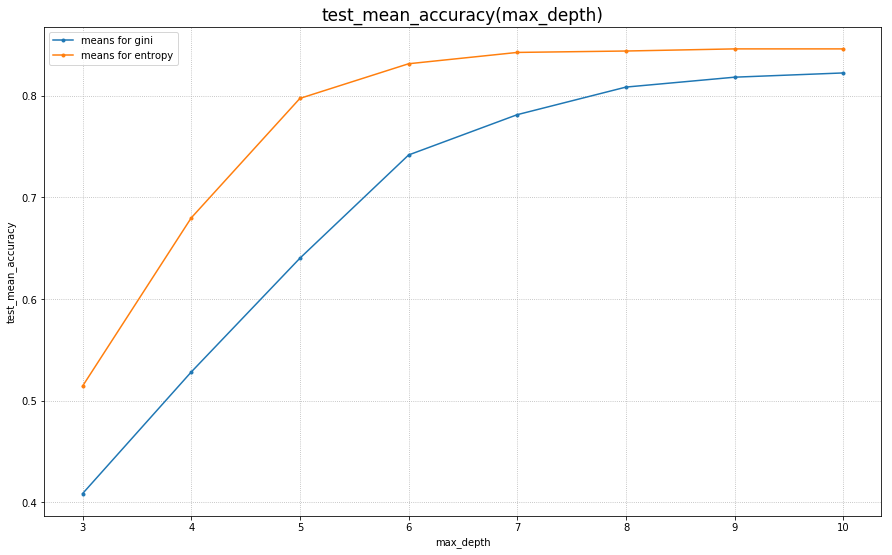

In [847]:
plt.figure(figsize=(15, 9))
plt.xlabel('max_depth')
plt.ylabel('test_mean_accuracy')
plt.title('test_mean_accuracy(max_depth)', size = 17)
plt.grid(ls=':')

plt.plot(np.arange(3, 11), means[0:8], '.-', label = 'means for gini')
plt.plot(np.arange(3, 11), means[8:], '.-', label = 'means for entropy')


plt.legend()
plt.show()


Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

** Деревья небольшой глубины очень плохо классифицируют (что неудивительно). С увеличением max_depth accuracy возрастает, но до определенного момента, чего и следовало ожидать.
Судя по графику, оптимальное параметры из данного сета -- это {'criterion': 'entropy', 'max_depth': 9} **

Используя найденные оптимальные значения max_depth и criterion, обучите решающее дерево на X_train, y_train и вычислите вероятности принадлежности к классам для X_test.

In [849]:
tree_best_params = DecisionTree(max_depth=9, criterion='entropy')
tree_best_params.fit(X_train, Y_train)
proba = tree_best_params.predict_proba(X_test)
proba

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Для полученной матрицы вычислите усредненные по всем объектам из `X_test` значения вероятностей принадлежности к классам.

In [850]:
classes_proba = np.sum(proba, axis=0) / proba.shape[0]
classes_proba

array([0.08611111, 0.08968254, 0.08214286, 0.09444444, 0.12469829,
       0.13611111, 0.10079365, 0.1       , 0.08231229, 0.1037037 ])

Чему примерно равна максимальная вероятность в полученном векторе?

In [851]:
for c, prob in zip(np.arange(0, 10), classes_proba):
    print('Probability for "{}": {}'.format(c, prob))

Probability for "0": 0.08611111111111111
Probability for "1": 0.08968253968253968
Probability for "2": 0.08214285714285714
Probability for "3": 0.09444444444444444
Probability for "4": 0.12469829379941735
Probability for "5": 0.1361111111111111
Probability for "6": 0.1007936507936508
Probability for "7": 0.1
Probability for "8": 0.08231228821116464
Probability for "9": 0.10370370370370369


In [852]:
np.max(classes_proba)

0.1361111111111111

### Регрессия (10% баллов)

С помощью метода `load_boston` загрузите датасет `boston`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие регрессионные деревья и убедитесь, что критерии `variance` и `mad_median` дают разные результаты.

In [926]:
boston_data, boston_label = load_boston(return_X_y=True)
X_train, X_test, Y_train, Y_test = train_test_split(boston_data, boston_label, test_size=0.2, random_state=42)

In [915]:
tree_variance = DecisionTree(max_depth=6, min_samples_split=2, criterion='variance')
tree_variance.fit(X_train, Y_train)
answer_variance = tree_variance.predict(X_test)

/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [916]:
tree_mad_median = DecisionTree(max_depth=6, min_samples_split=2, criterion='mad_median')
tree_mad_median.fit(X_train, Y_train)
answer_mad_median = tree_mad_median.predict(X_test)

/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


In [917]:
compare = (answer_variance == answer_mad_median)

In [918]:
len(np.argwhere(compare == True)) / len (answer_entropy)

0.005555555555555556

**Убедились, что критерии `variance` и `mad_median` дают разные результаты.**

С помощью 5-кратной кросс-валидации подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - `range(2, 9)`, а для `criterion` - {'variance', 'mad_median'}. Критерий качества `scoring`='neg_mean_squared_error'.

In [927]:
parameters = {'max_depth': np.arange(2,9), 'criterion': ('variance', 'mad_median')}
clf = GridSearchCV(DecisionTree(), parameters, scoring='neg_mean_squared_error')
clf.fit(X_train, Y_train)

/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is sepa

/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is sepa

/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/darcy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  
/Users/darcy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: Runtime

GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTree(criterion='gini', cur_depth=0, debug=None, max_depth=inf,
       min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': array([2, 3, 4, 5, 6, 7, 8]), 'criterion': ('variance', 'mad_median')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

Постройте графики средних значений критерия качества `neg_mean_squared_error` для критериев `variance` и `mad_median` в зависимости от `max_depth`.

In [921]:
means = clf.cv_results_['mean_test_score']
for mean, params in zip(means, clf.cv_results_['params']):
    print("%0.3f  for %r" % (mean, params))

-30.313  for {'criterion': 'variance', 'max_depth': 2}
-33.262  for {'criterion': 'variance', 'max_depth': 3}
-27.116  for {'criterion': 'variance', 'max_depth': 4}
-24.690  for {'criterion': 'variance', 'max_depth': 5}
-24.468  for {'criterion': 'variance', 'max_depth': 6}
-23.977  for {'criterion': 'variance', 'max_depth': 7}
-24.926  for {'criterion': 'variance', 'max_depth': 8}
-31.173  for {'criterion': 'mad_median', 'max_depth': 2}
-28.262  for {'criterion': 'mad_median', 'max_depth': 3}
-26.610  for {'criterion': 'mad_median', 'max_depth': 4}
-27.923  for {'criterion': 'mad_median', 'max_depth': 5}
-26.646  for {'criterion': 'mad_median', 'max_depth': 6}
-26.353  for {'criterion': 'mad_median', 'max_depth': 7}
-26.679  for {'criterion': 'mad_median', 'max_depth': 8}


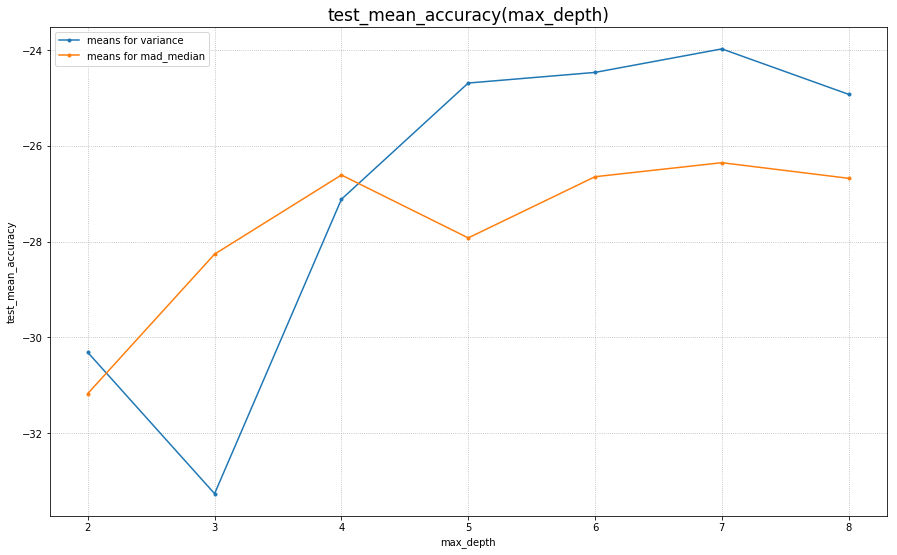

In [947]:
plt.figure(figsize=(15, 9))
plt.xlabel('max_depth')
plt.ylabel('test_mean_accuracy')
plt.title('test_mean_accuracy(max_depth)', size = 17)
plt.grid(ls=':')

plt.plot(np.arange(2, 9), means[0:7], '.-', label = 'means for variance')
plt.plot(np.arange(2, 9), means[7:], '.-', label = 'means for mad_median')


plt.legend()
plt.show()

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

**Оптимальные значения для данного сета параметров: criterion = 'variance', max_depth = 7**